# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure, data, transform
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2
from skimage.filters import rank
from skimage.util import img_as_ubyte
from skimage.morphology import disk

/tmp/ipykernel_13456/3757240414.py:7: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter as gauss
/tmp/ipykernel_13456/3757240414.py:8: DeprecationWarning: Please use `median_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import median_filter as med


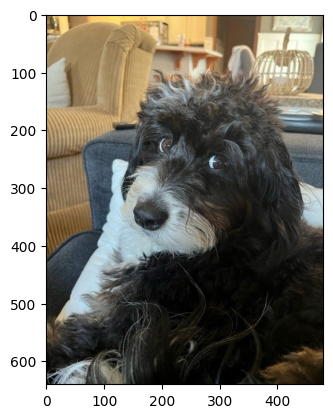

In [2]:
original_image = Image.open('data/emmy.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('data/img.npy', original_image)

#Load the image
original_image = np.load('data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image. 

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

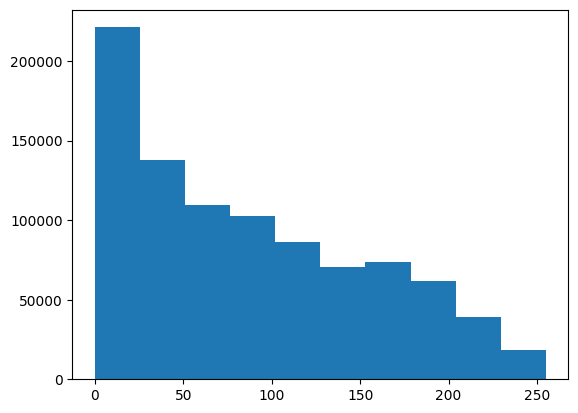

In [3]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

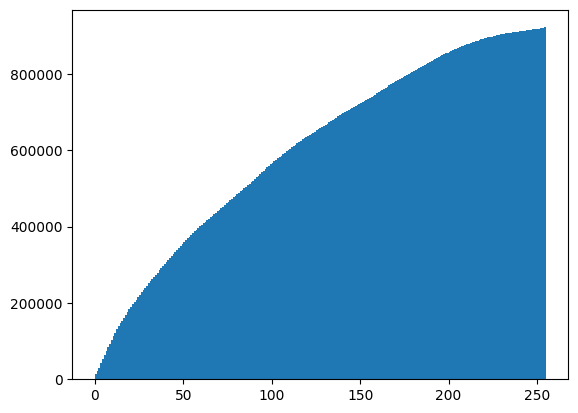

In [4]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/home/giovacuna/.local/lib/python3.11/site-packages/skimage/_shared/utils.py:316: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


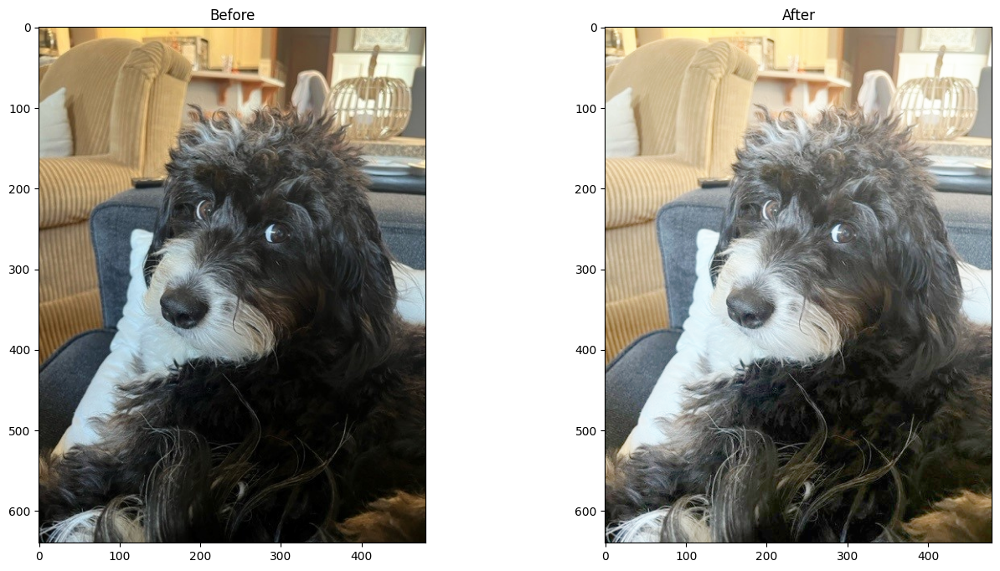

In [5]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

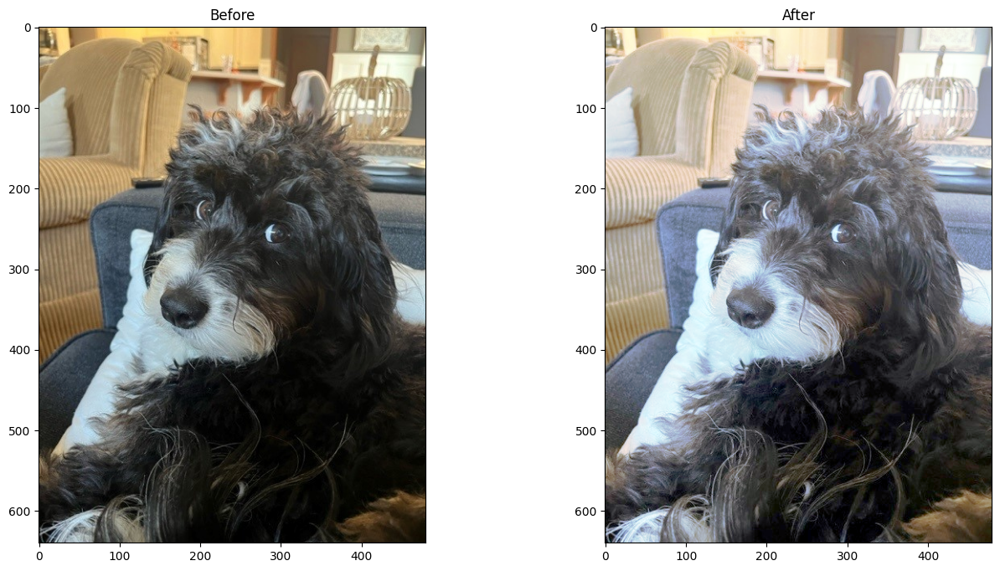

In [6]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
ImageOps.equalize(Image.fromarray(original_image))
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

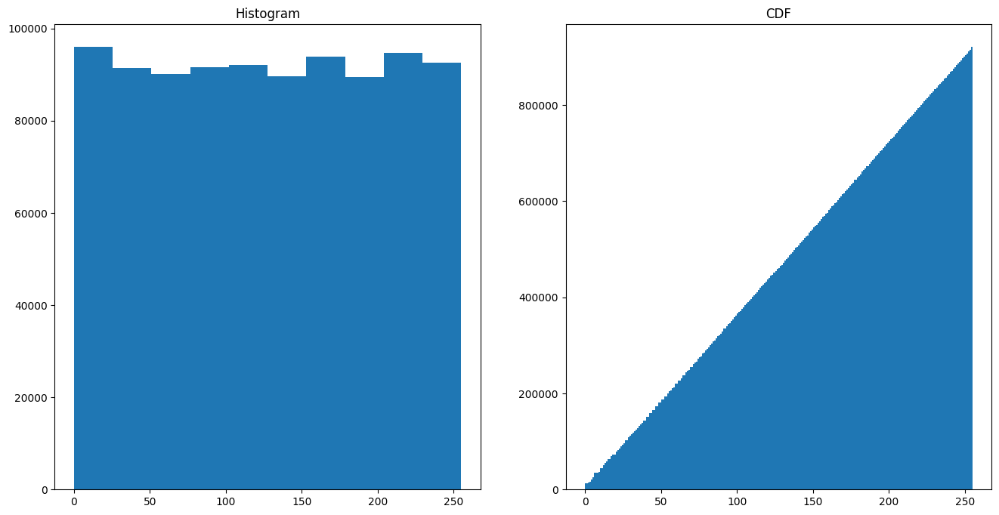

In [7]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

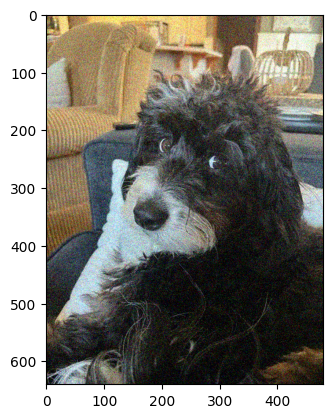

In [8]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

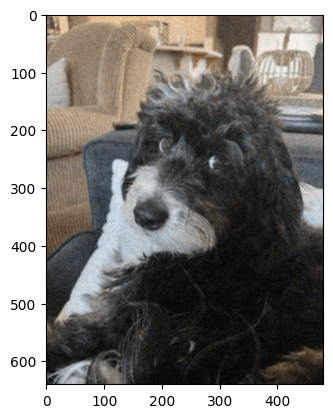

In [9]:
img3_gauss = gauss(img_n, sigma=1)   
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

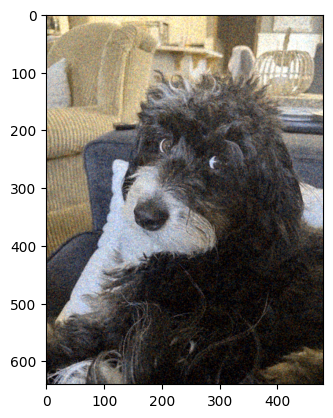

In [10]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

In [11]:
from image_slicer import slice

n = 4
t1,t2,t3,t4=slice('data/emmy.jpg', n)

In [12]:
t1.save('data/image_01_01.png', format='png')
t2.save('data/image_01_02.png', format='png')
t3.save('data/image_02_01.png', format='png')
t4.save('data/image_02_02.png', format='png')

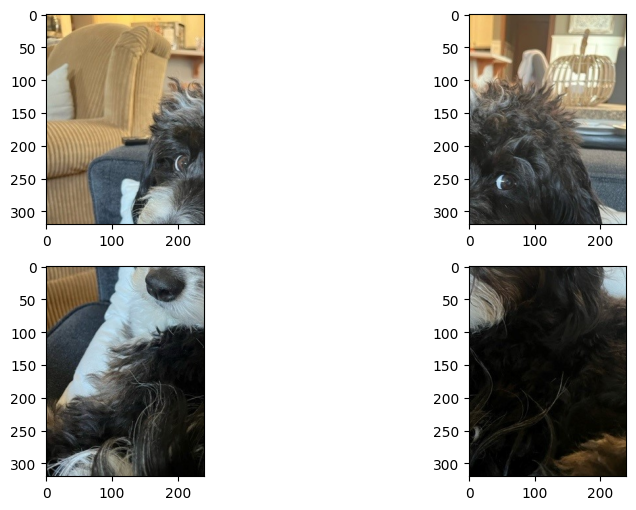

In [13]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
image_01_01 = Image.open(f'data/image_01_01.png')
np.save('data/image_01_01.npy', image_01_01)
image_01_01 = np.load('data/image_01_01.npy')
plt.imshow(image_01_01)

plt.subplot(2,2,2)
image_01_02 = Image.open(f'data/image_01_02.png')
np.save('data/image_01_02.npy', image_01_02)
image_01_02 = np.load('data/image_01_02.npy')
plt.imshow(image_01_02)

plt.subplot(2,2,3)
image_02_01 = Image.open(f'data/image_02_01.png')
np.save('data/image_02_01.npy', image_02_01)
image_02_01 = np.load('data/image_02_01.npy')
plt.imshow(image_02_01)

plt.subplot(2,2,4)
image_02_02 = Image.open(f'data/image_02_02.png')
np.save('data/image_02_02.npy', image_02_02)
image_02_02 = np.load('data/image_02_02.npy')
plt.imshow(image_02_02)

plt.show()

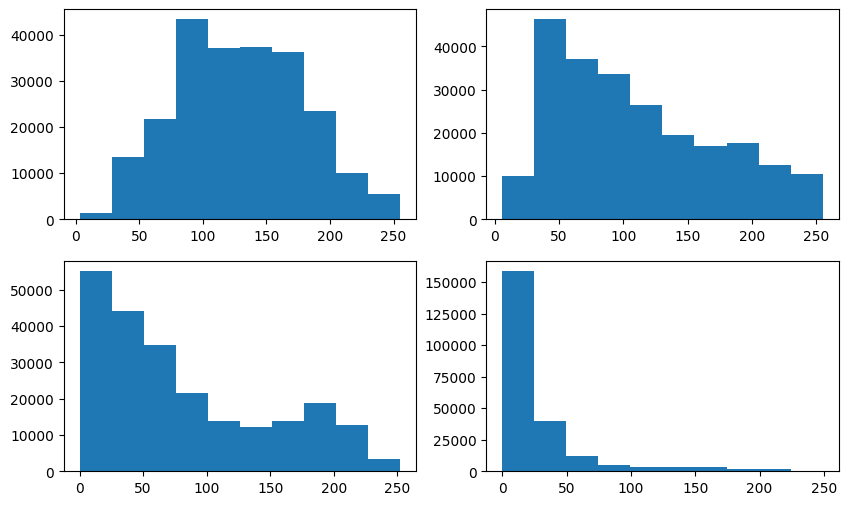

In [14]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)

plt.hist(image_01_01.ravel())
plt.subplot(2,2,2)
plt.hist(image_01_02.ravel())
plt.subplot(2,2,3)
plt.hist(image_02_01.ravel())
plt.subplot(2,2,4)
plt.hist(image_02_02.ravel())
plt.show()

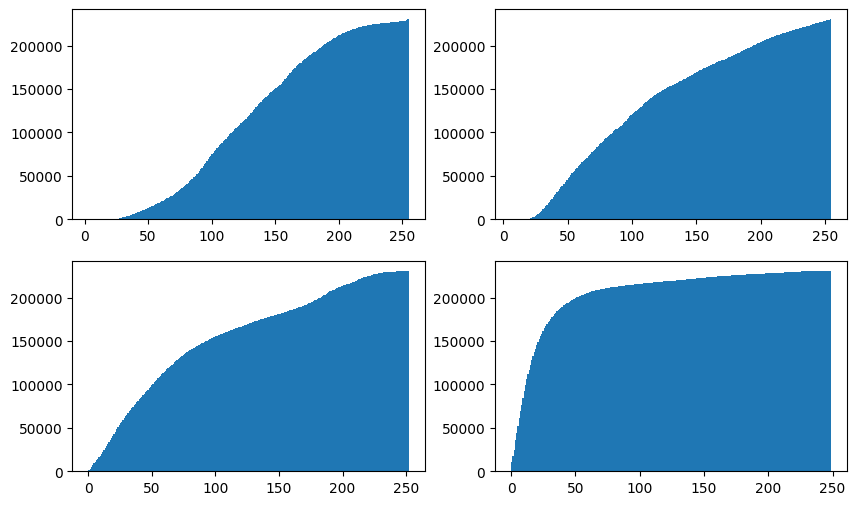

In [15]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
plt.hist(image_01_01.ravel(), bins=255, cumulative=True)
plt.subplot(2,2,2)
plt.hist(image_01_02.ravel(), bins=255, cumulative=True)
plt.subplot(2,2,3)
plt.hist(image_02_01.ravel(), bins=255, cumulative=True)
plt.subplot(2,2,4)
plt.hist(image_02_02.ravel(), bins=255, cumulative=True)
plt.show()

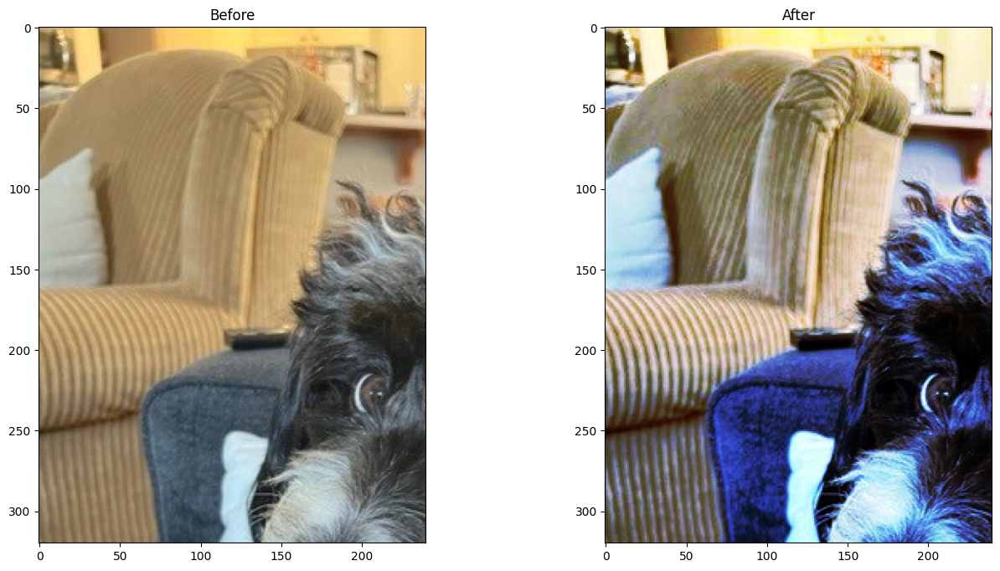

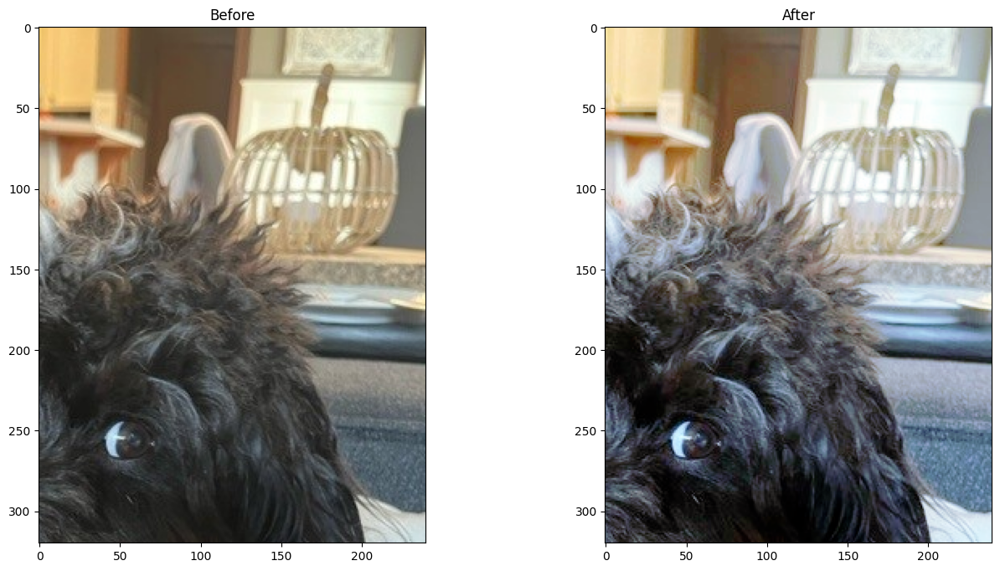

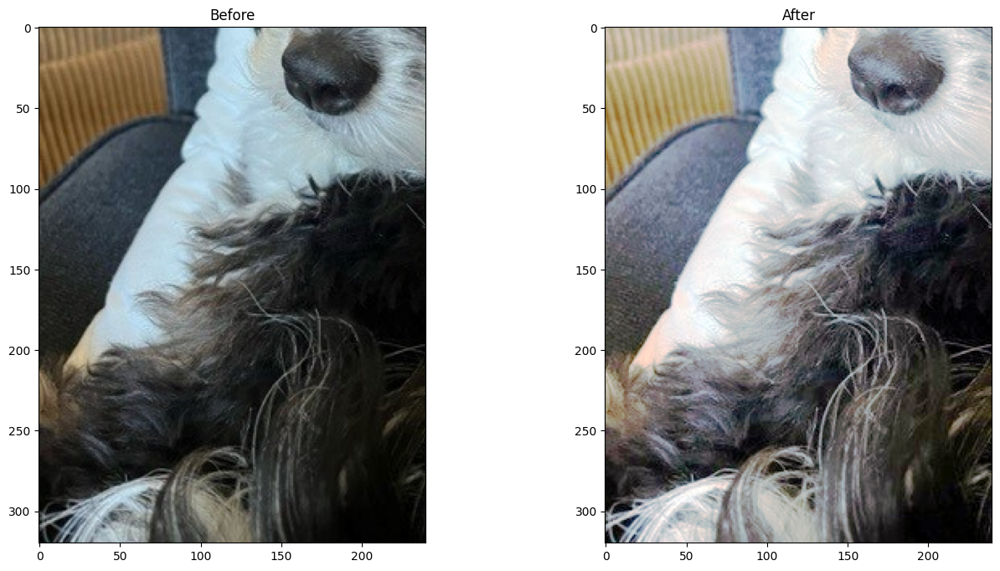

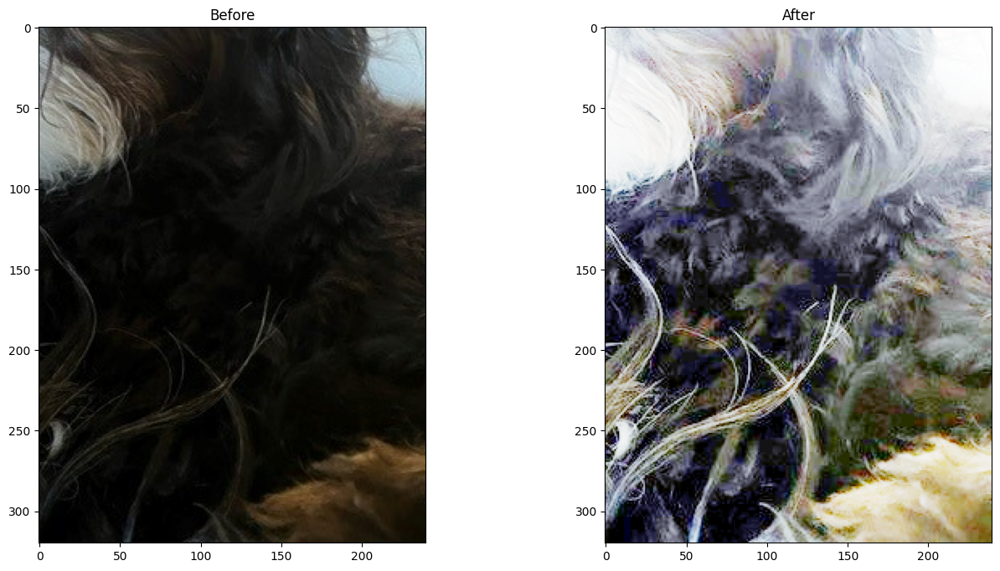

In [16]:
proc_images = list()
for item in [image_01_01,image_01_02,image_02_01,image_02_02]:
    image_PIL_eq = ImageOps.equalize(Image.fromarray(item))
    fig = plt.figure(figsize=(16, 8))
    a=fig.add_subplot(1,2,1)
    imgplot = plt.imshow(item)
    a.set_title('Before')
    a=fig.add_subplot(1,2,2)
    imgplot = plt.imshow(image_PIL_eq)
    np.save('data/img.npy', image_PIL_eq)
    original_image = np.load('data/img.npy')
    proc_images.append(original_image)
    a.set_title('After')
    plt.show()

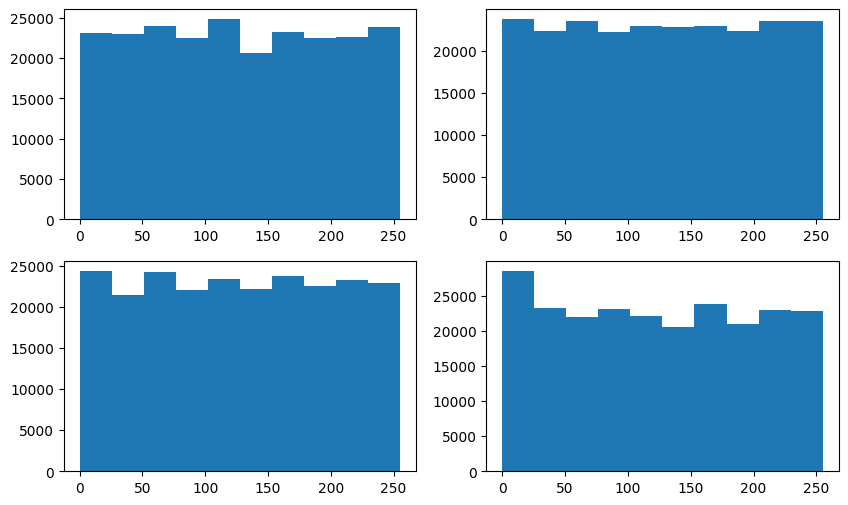

In [17]:
fig = plt.figure(figsize=(10, 6))
plt.subplot(2,2,1)
plt.hist(proc_images[0].ravel())
plt.subplot(2,2,2)
plt.hist(proc_images[1].ravel())
plt.subplot(2,2,3)
plt.hist(proc_images[2].ravel())
plt.subplot(2,2,4)
plt.hist(proc_images[3].ravel())
plt.show()

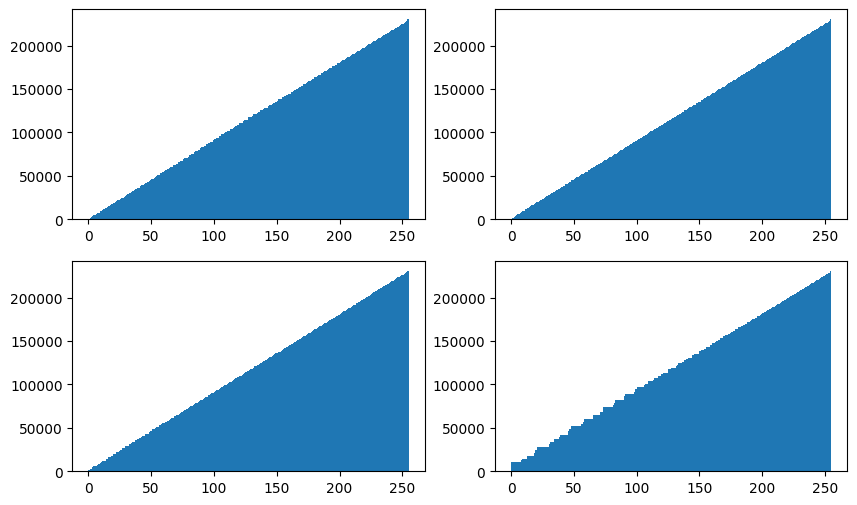

In [18]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
plt.hist(proc_images[0].ravel(), bins=255, cumulative=True)
plt.subplot(2,2,2)
plt.hist(proc_images[1].ravel(), bins=255, cumulative=True)
plt.subplot(2,2,3)
plt.hist(proc_images[2].ravel(), bins=255, cumulative=True)
plt.subplot(2,2,4)
plt.hist(proc_images[3].ravel(), bins=255, cumulative=True)
plt.show()

In [19]:
original_images = [image_01_01,image_01_02,image_02_01,image_02_02]

0


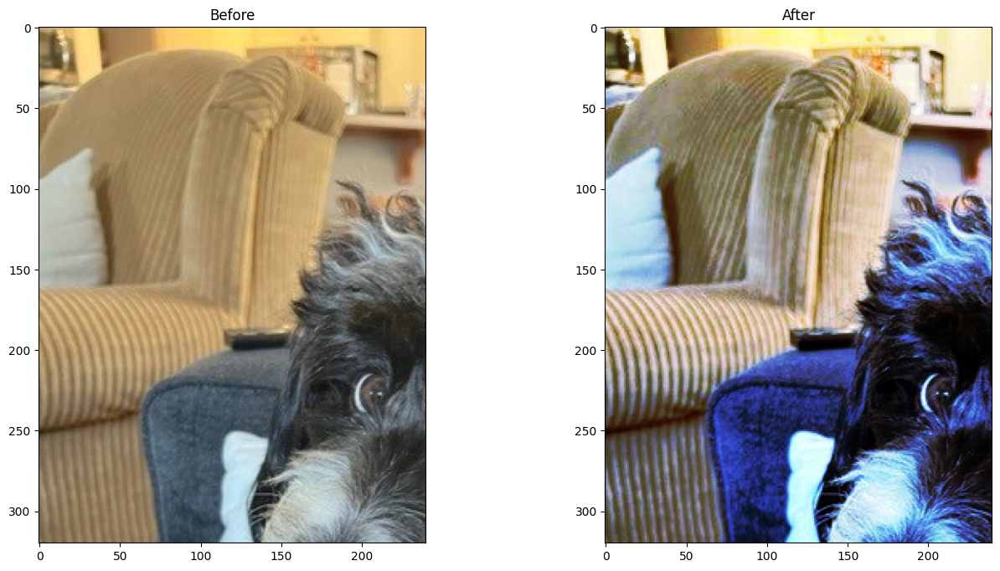

1


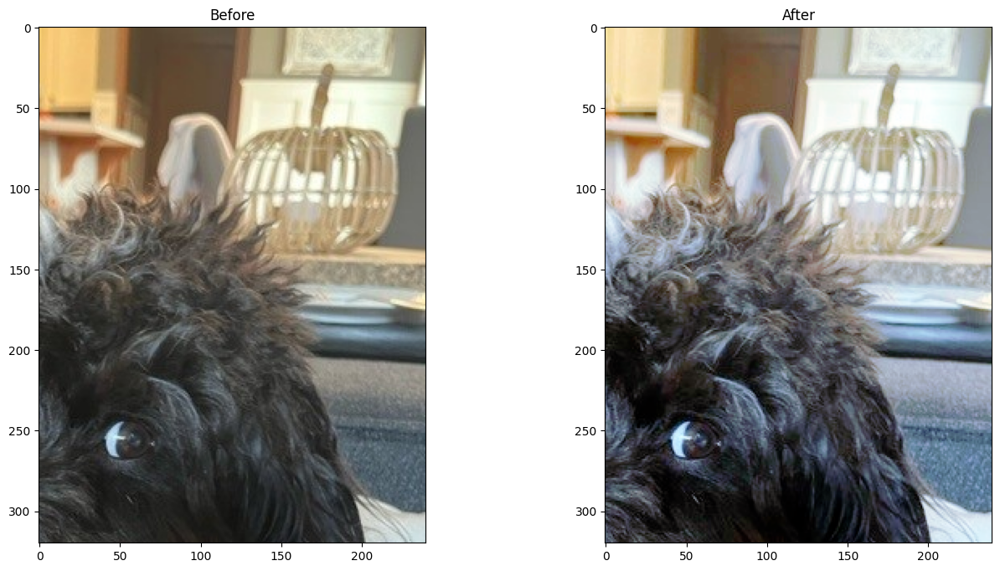

2


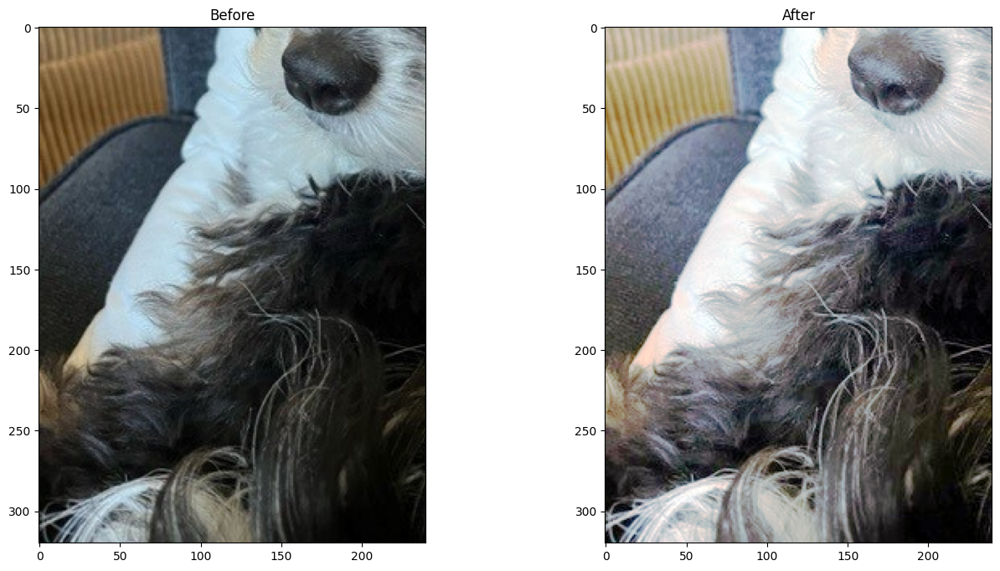

3


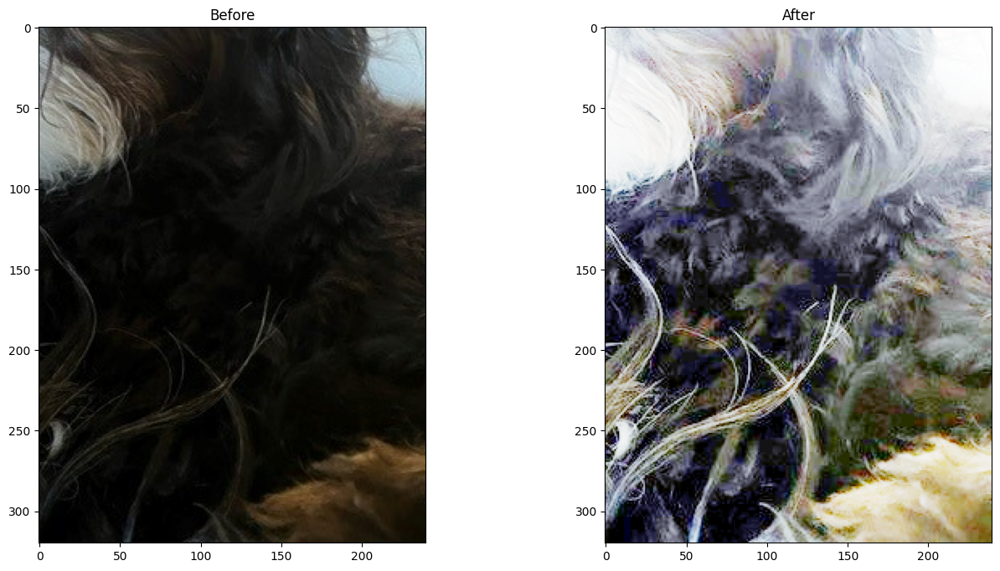

In [20]:
for i in range(len(proc_images)):
    print(i)
    fig = plt.figure(figsize=(16, 8))
    a=fig.add_subplot(1,2,1)
    imgplot = plt.imshow(original_images[i])
    a.set_title('Before')
    a=fig.add_subplot(1,2,2)
    imgplot = plt.imshow(proc_images[i])
    a.set_title('After')
    plt.show()

# 2. Sliding Window Adaptive Histogram Equalization (SWAHE)

In [21]:
def windowed_histogram_similarity(image, footprint, reference_hist, n_bins):
    # Compute normalized windowed histogram feature vector for each pixel
    px_histograms = rank.windowed_histogram(image, footprint, n_bins=n_bins)

    # Reshape coin histogram to (1,1,N) for broadcast when we want to use it in
    # arithmetic operations with the windowed histograms from the image
    reference_hist = reference_hist.reshape((1, 1) + reference_hist.shape)

    # Compute Chi squared distance metric: sum((X-Y)^2 / (X+Y));
    # a measure of distance between histograms
    X = px_histograms
    Y = reference_hist

    num = (X - Y) ** 2
    denom = X + Y
    denom[denom == 0] = np.infty
    frac = num / denom

    chi_sqr = 0.5 * np.sum(frac, axis=2)

    # Generate a similarity measure. It needs to be low when distance is high
    # and high when distance is low; taking the reciprocal will do this.
    # Chi squared will always be >= 0, add small value to prevent divide by 0.
    similarity = 1 / (chi_sqr + 1.0e-4)

    return similarity

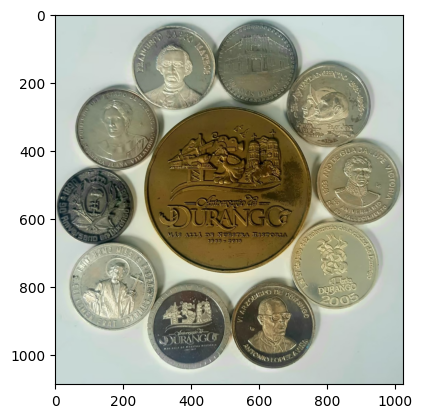

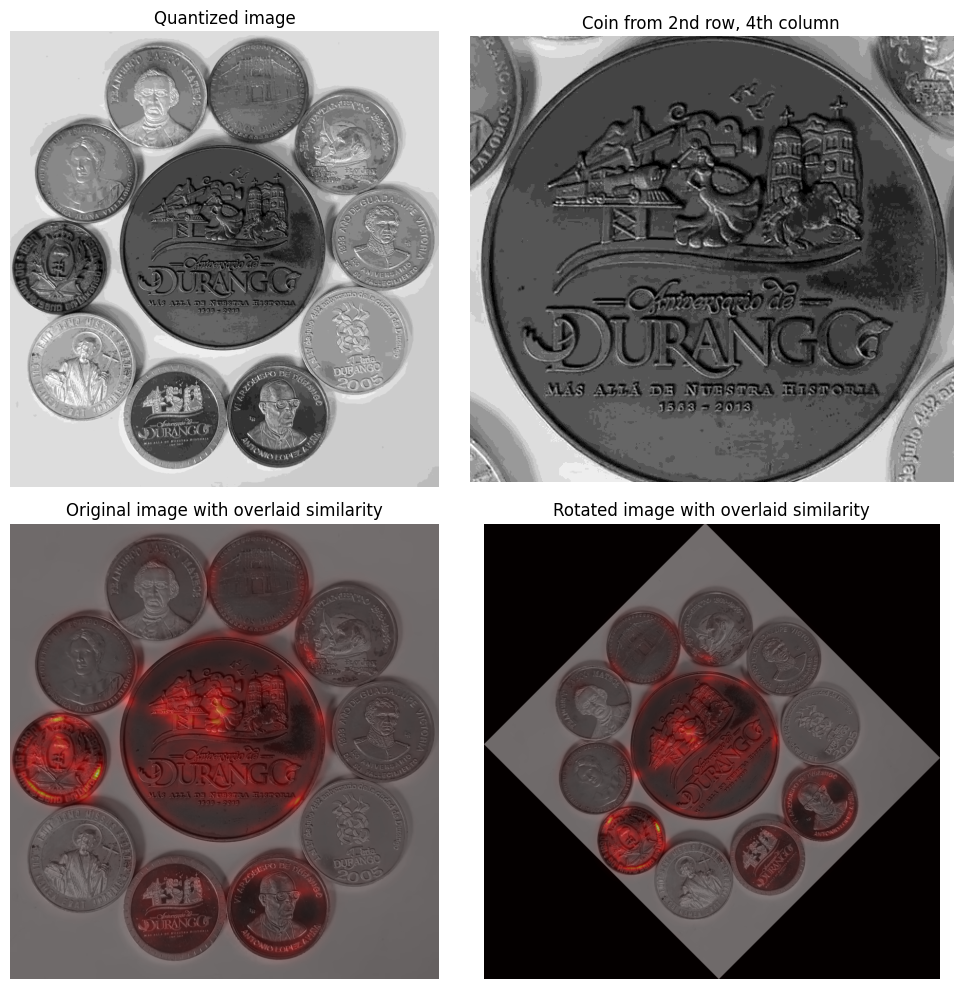

In [22]:
coin_original_image = Image.open('data/Imagen_coin.jpeg')
plt.imshow(coin_original_image)

# Save the image
np.save('data/img_coin.npy', coin_original_image)

#Load the image
coin_original_image = np.load('data/img_coin.npy')

picture = cv2.cvtColor(coin_original_image, cv2.COLOR_RGB2GRAY )
img = img_as_ubyte(picture)

# Quantize to 16 levels of grayscale; this way the output image will have a
# 16-dimensional feature vector per pixel
quantized_img = img // 16

# Select the coin from the 4th column, second row.
# Coordinate ordering: [x1,y1,x2,y2]
coin_coords = [250, 276, 760 ,746]   # 44 x 44 region
coin = quantized_img[coin_coords[1]:coin_coords[3],coin_coords[0]:coin_coords[2]]

# Compute coin histogram and normalize
coin_hist, _ = np.histogram(coin.flatten(), bins=16, range=(0, 16))
coin_hist = coin_hist.astype(float) / np.sum(coin_hist)

# Compute a disk shaped mask that will define the shape of our sliding window
# Example coin is ~44px across, so make a disk 61px wide (2 * rad + 1) to be
# big enough for other coins too.
footprint = disk(30)

# Compute the similarity across the complete image
similarity = windowed_histogram_similarity(quantized_img, footprint, coin_hist,coin_hist.shape[0])

# Now try a rotated image
rotated_img = img_as_ubyte(transform.rotate(img, 45.0, resize=True))
# Quantize to 16 levels as before
quantized_rotated_image = rotated_img // 16
# Similarity on rotated image
rotated_similarity = windowed_histogram_similarity(quantized_rotated_image,footprint, coin_hist,coin_hist.shape[0])

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

axes[0, 0].imshow(quantized_img, cmap='gray')
axes[0, 0].set_title('Quantized image')
axes[0, 0].axis('off')

axes[0, 1].imshow(coin, cmap='gray')
axes[0, 1].set_title('Coin from 2nd row, 4th column')
axes[0, 1].axis('off')

axes[1, 0].imshow(img, cmap='gray')
axes[1, 0].imshow(similarity, cmap='hot', alpha=0.5)
axes[1, 0].set_title('Original image with overlaid similarity')
axes[1, 0].axis('off')

axes[1, 1].imshow(rotated_img, cmap='gray')
axes[1, 1].imshow(rotated_similarity, cmap='hot', alpha=0.5)
axes[1, 1].set_title('Rotated image with overlaid similarity')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# 3. Algoritmo CLAHE

In [23]:
def show_rgb_image(image, title=None, conversion=cv2.COLOR_BGR2RGB):

    # Converts from one colour space to the other. this is needed as RGB
    # is not the default colour space for OpenCV
    image = cv2.cvtColor(image, conversion)

    # Show the image
    plt.imshow(image)

    # remove the axis / ticks for a clean looking image
    plt.xticks([])
    plt.yticks([])

    # if a title is provided, show it
    if title is not None:
        plt.title(title)

    plt.show()

Lista de imagenes a manipular

In [24]:
list_images = ['data/emmy.jpg','data/carrazo.jpg','data/IMG00008-20110521-1736.jpg']

Importamos la imagen a manipular

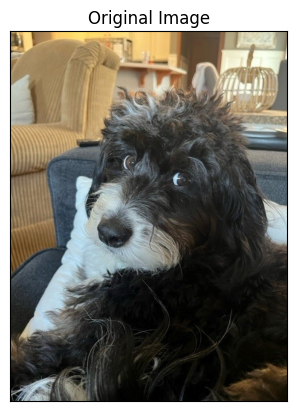

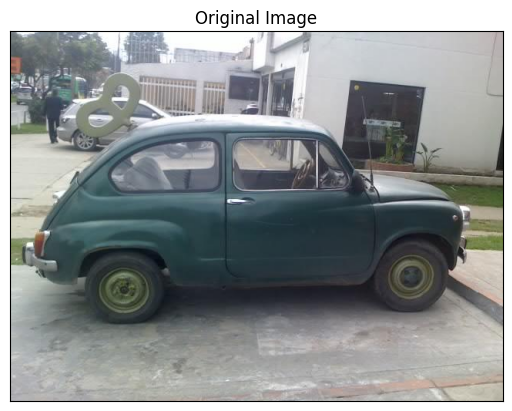

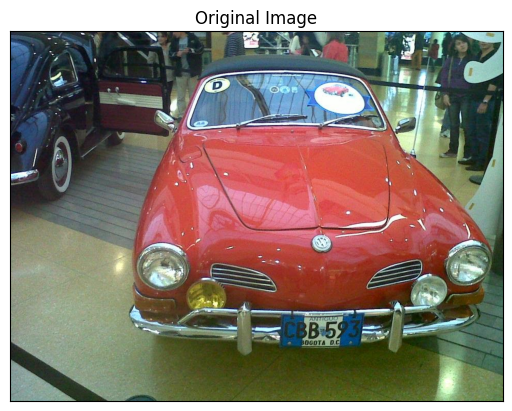

In [25]:
for imagen in list_images:
    img = cv2.imread(imagen)
    show_rgb_image(img, 'Original Image')

Convertimos la imagen a escala de grises

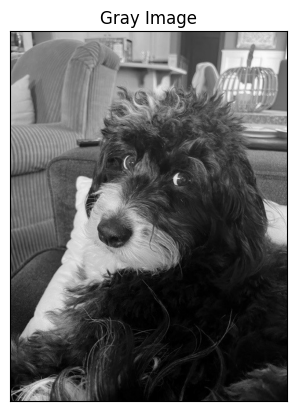

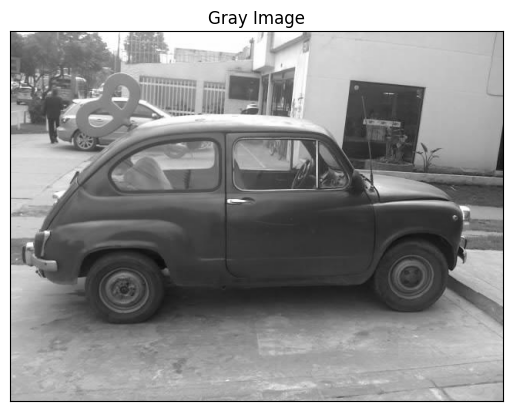

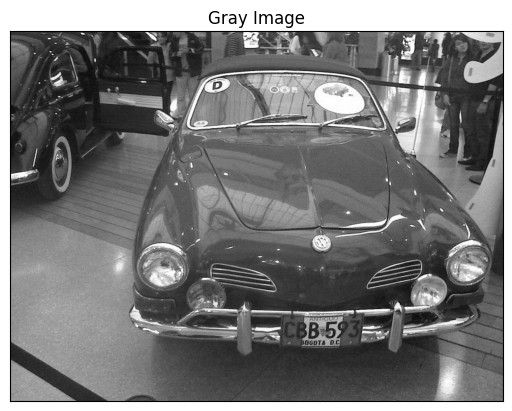

In [26]:
for imagen in list_images:
    img = cv2.imread(imagen)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY )
    show_rgb_image(img, 'Gray Image' )

# Creamos un objeto CLAHE

In [27]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

Aplicamos el objeto CLAHE a la imagen usando el método cv2.hconcat.

Obteniendo como resultado

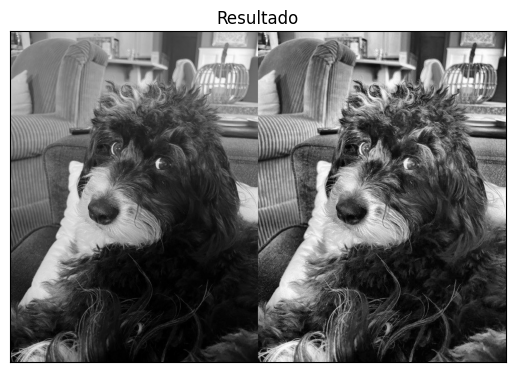

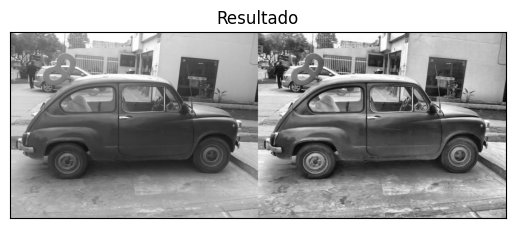

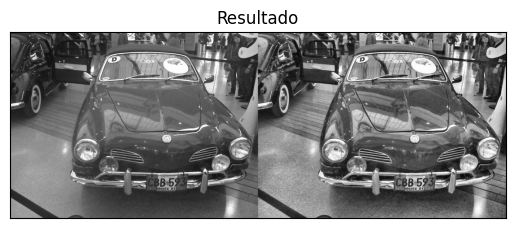

In [28]:
for imagen in list_images:
    img = cv2.imread(imagen)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY )
    out = clahe.apply(img)
    out1 = cv2.hconcat([img,out])
    show_rgb_image(out1, 'Resultado' )